In [1]:
import scanpy as sc 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import sys

### Segmentation

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import anndata
import geopandas as gpd
import scanpy as sc

from tifffile import imread, imwrite
from csbdeep.utils import normalize
from stardist.models import StarDist2D
from shapely.geometry import Polygon, Point
from scipy import sparse
from matplotlib.colors import ListedColormap

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


In [3]:
adata_sc = sc.read_h5ad('/Users/allywang/Desktop/work/S2025/SpaceOracle/data/mouse_kidney_13.h5ad')
adata_sc.X = adata_sc.layers['normalized_count']
adata_sc

AnnData object with n_obs × n_vars = 8509 × 3058
    obs: 'ct1', 'ct2', 'ct3', 'ct4', 'cond', 'medulla_cortex', 'domain', 'cell_type', 'cell_type_int'
    uns: 'cell_thresholds', 'cell_type_colors', 'neighbors', 'pca', 'received_ligands', 'received_ligands_tfl', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
    varm: 'PCs'
    layers: 'imputed_count', 'normalized_count', 'raw_count'
    obsp: 'connectivities', 'distances'

In [4]:
%matplotlib inline

In [5]:
xy = pd.DataFrame(adata.obsm['spatial'], columns=['x', 'y'], index=adata.obs_names)
df = xy.join(adata.obs).join(adata.to_df(layer='imputed_count'))

In [6]:
df = df[df.x > 500]

In [7]:
[i for i in df.ct3.value_counts().index if 'Mac' in i]

['Mac_2',
 'Mac_0',
 'Mac_3_TGFB3+',
 'Mac_4',
 'Mac_1_CellCycle+_1',
 'Mac_1_CellCycle+_0']

In [8]:
ct_interest = ['Mac_2',
 'Mac_0',
#  'Mac_3_TGFB3+',
#  'Mac_4',
#  'Mac_1_CellCycle+_1',
#  'Mac_1_CellCycle+_0'
 ]

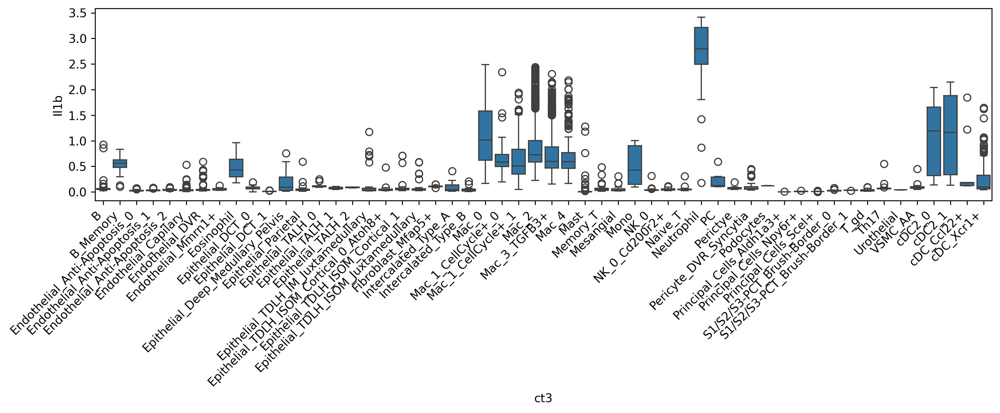

In [33]:
plt.figure(figsize=(12, 5))
sns.boxplot(data=df, x='ct3', y='Il1b')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


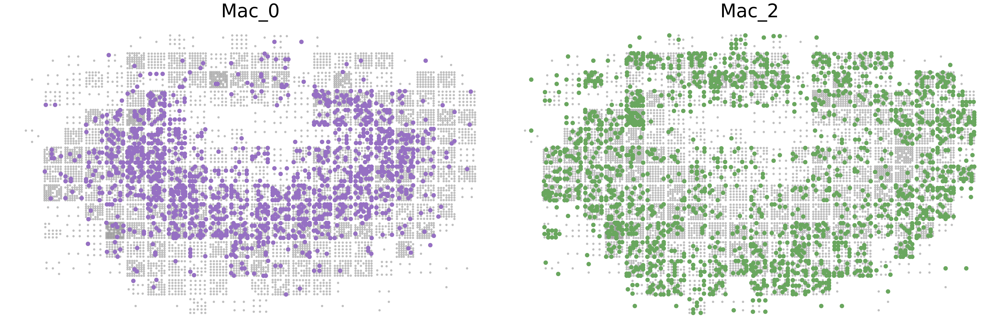

In [41]:
plt.rcParams['figure.figsize'] = (30, 10)
plt.rcParams['figure.dpi'] = 140

fig, axes = plt.subplots(1, 2)
axes = axes.flatten()
ct_interest = ['Mac_0', 'Mac_2']

ct3_mapping = {
    'Mac_0': "#9671c3",
    'Mac_2': "#69a75f"
}

for i, cell_type in enumerate(ct_interest):
    ax = axes[i]
    df_ = df[df['ct3'] == cell_type]
    
    ax.scatter(
        df['x'], df['y'],
        c='grey',
        alpha=0.5,
        s=20, marker='o',
        linewidth=0.1, edgecolor='black',
    )

    ax.scatter(
        df_['x'], df_['y'],
        c=ct3_mapping[cell_type],
        s=90, marker='o',
        linewidth=0.0, edgecolor='black',
    )
    
    ax.set_axis_off()
    ax.set_title(cell_type, fontsize=40)

plt.tight_layout()
plt.show()

In [20]:
[i for i in adata.var_names if 'Il1' in i]

['Il1r2',
 'Il1r1',
 'Il1rl1',
 'Il18r1',
 'Il18rap',
 'Il10',
 'Il1b',
 'Il12rb2',
 'Il17ra',
 'Il17c',
 'Il17rb',
 'Il1rap']

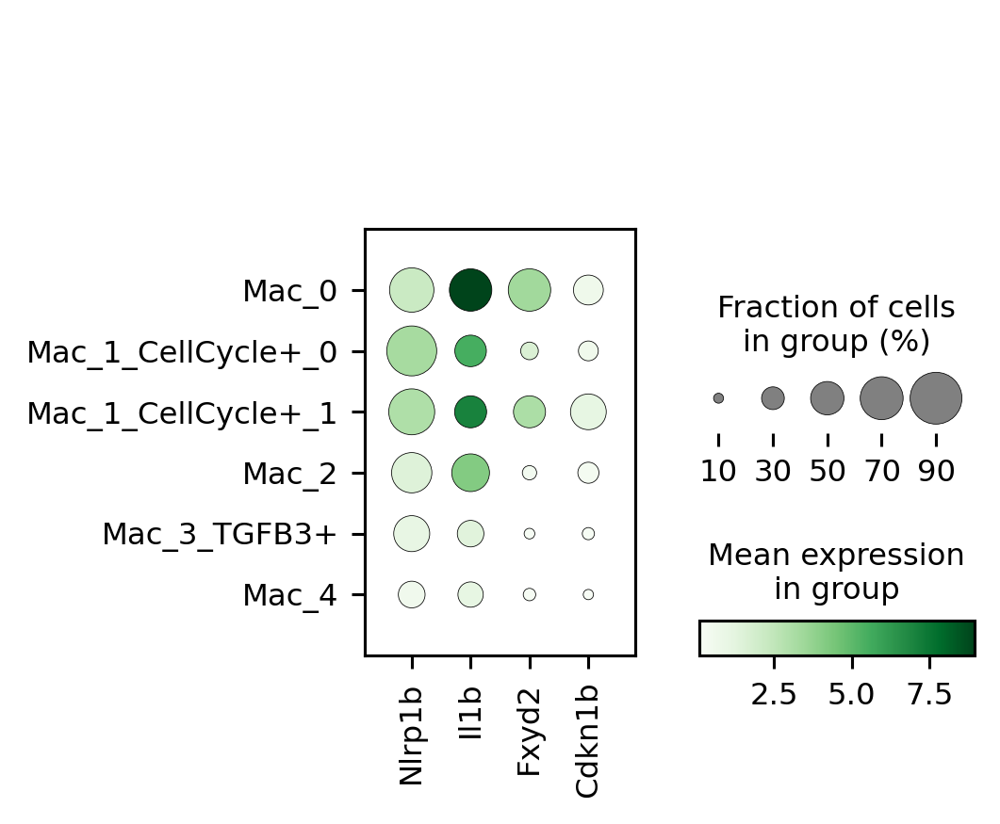

In [39]:
sc.pl.dotplot(
    adata[adata.obs.ct3.isin(['Mac_2',
 'Mac_0',
 'Mac_3_TGFB3+',
 'Mac_4',
 'Mac_1_CellCycle+_1',
 'Mac_1_CellCycle+_0'
 ])], 
    var_names=['Nlrp1b', 'Il1b', 'Fxyd2', 'Cdkn1b'], 
    groupby='ct3', cmap='Greens', 
    show=True)

In [133]:
atmp = adata[adata.obs.ct3.isin(['Mac_0', 'Mac_2'])].copy()

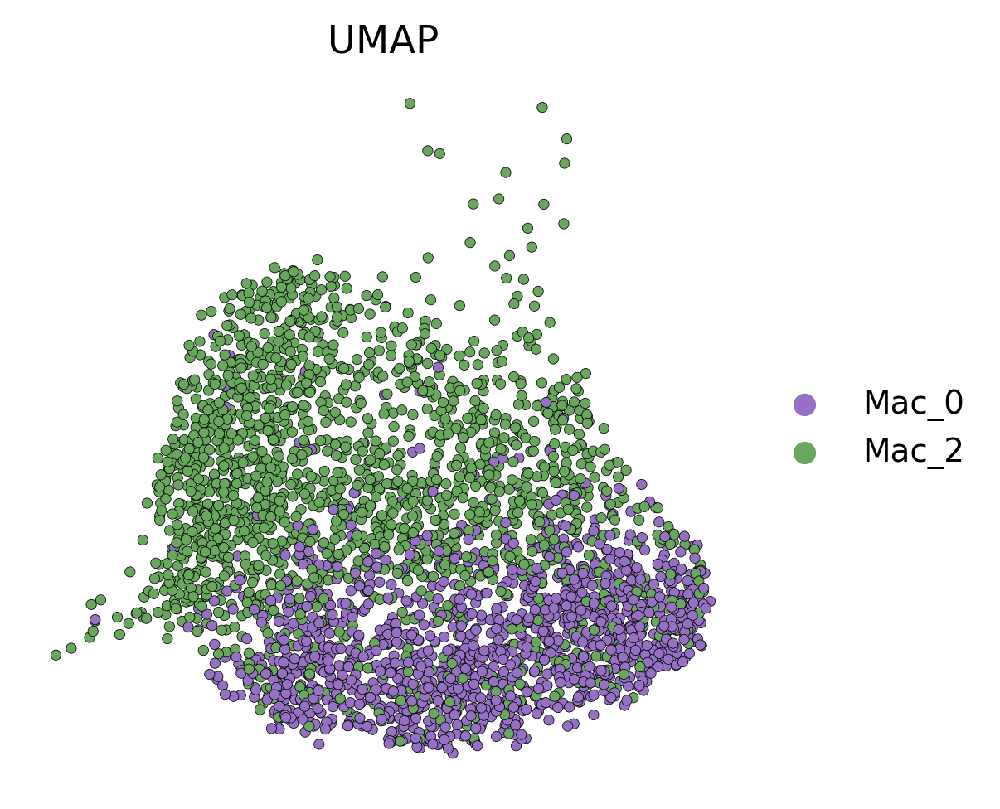

In [134]:
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 140
color_dict = {
    'Mac_0': "#9671c3",
    'Mac_2': "#69a75f"}

sc.pl.umap(atmp, color='ct3', s=40, 
    frameon=False, palette=color_dict, 
    add_outline=False, title='UMAP', linewidth=0.2, edgecolor='black')

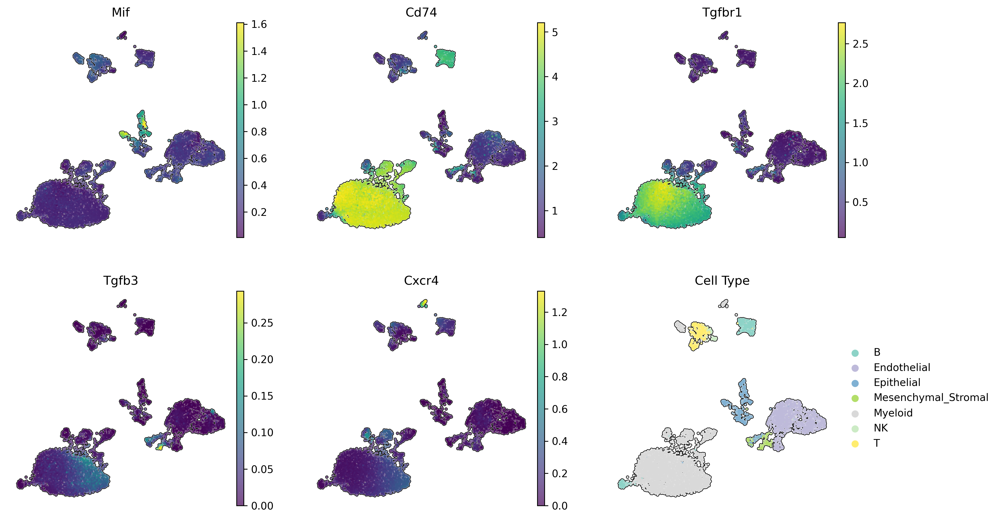

In [108]:
sc.pl.embedding(
    adata,
    basis='umap',
    color=['Mif', 'Cd74', 'Tgfbr1', 'Tgfb3', 'Cxcr4', 'ct1'],
    show=False,
    palette='Set3',
    ncols=3,
    frameon=False,
    add_outline=True,
    layer='imputed_count',
    title=['Mif', 'Cd74', 'Tgfbr1', 'Tgfb3', 'Cxcr4', 'Cell Type']
    
)
plt.show()

In [16]:
osmogenes = ['Aqp2', 'Aqp4', 'Cryab', 'Elf5', 'Mal', 'Muc1',
        'Pax2', 'Sgk1', 'Slc14a2', 'Slc5a3']
hypoxia = ['Anxa2', 'Btg1', 'Cdkn1b', 'Ddit3', 'Hexa', 'Hoxb9', 'Hspa5', 'Tes']
markers = ['Wt1', 'Nphs2', 'Sord', 'Cyp2e1', 'Lrp2', 'Bst1', 'Slc4a11', 'Slc12a1', 
        'Umod', 'Slc12a3', 'Calb1', 'Aqp2', 'Aqp4']
nephron = ['Cldn1', 'Spp2', 'Lrp2', 'Aqp1', 'Sptssb', 'Slc12a1', 'Slc12a3', 'Calb1']
collecting_duct = ['Hsd11b2', 'Aqp4', 'Aqp2', 'Atp6v1g3', 'Gata3', 'Calb1']
vascular = ['Kdr', 'Cdh5', 'Vegfa', 'Emcn', 'Podxl']
hema = ['Cd52', 'Fcer1g']
immune = ['Thy1', 'Cd79a', 'Pax5']
stroma = ['Col1a1', 'Meis1', 'Postn']
podocyte = ['Pax8', 'Nphs1', 'Podxl', 'Meis1', 'Aldh1a2']

In [28]:
[i for i in adata.var_names if 'xy' in i]

['Gxylt2', 'Fxyd4', 'Fxyd1', 'Fxyd6', 'Fxyd2', 'Pxylp1']

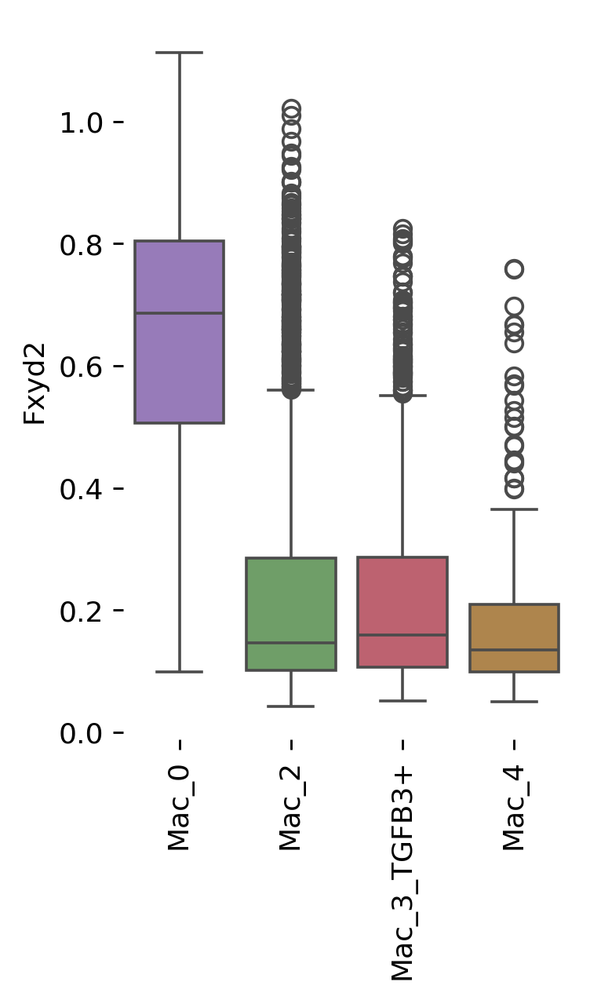

In [52]:
df = adata.to_df(layer='imputed_count').join(adata.obs['ct3'])[['Fxyd2', 'ct3']].query(
    'ct3.isin(["Mac_0", "Mac_2", "Mac_3_TGFB3+", "Mac_4"])')
df.ct3 = df.ct3.astype('string')

plt.figure(figsize=(3, 5))
sns.boxplot(data=df, x='ct3', y='Fxyd2', 
    palette=["#9671c3",
"#69a75f",
"#cc5366",
"#be883d"])
plt.xticks(rotation=90)
plt.xlabel('')
plt.box(False)
plt.tight_layout()
plt.show()

In [75]:
from spaceoracle.tools.network import RegulatoryFactory
co_grn = RegulatoryFactory(
    colinks_path='/Users/koush/Desktop/training_data/mouse_kidney_13_colinks.pkl',
    annot='cell_type_int'
)

In [76]:
from spaceoracle.models.parallel_estimators import *

cell_threshes = pd.read_parquet(
    '/Users/koush/Desktop/training_data/mouse_kidney_13_LRs.parquet')
adata.uns['cell_thresholds'] = cell_threshes
adata.uns['cell_thresholds'].shape

(8509, 196)

In [77]:
from spaceoracle.models.parallel_estimators import SpatialCellularProgramsEstimator

estimator = SpatialCellularProgramsEstimator(
    adata=adata,
    target_gene='Cd74',
    layer='imputed_count',
    cluster_annot='cell_type_int', 
    grn=co_grn,
    radius=100,
    contact_distance=30,
)

In [78]:
# estimator.plot_modulators()

In [80]:
estimator.fit(num_epochs=50, learning_rate=5e-3, score_threshold=0.1)

Fitting Cd74 with 407 modulators
	25 Transcription Factors
	325 Ligand-Receptor Pairs
	57 TranscriptionFactor-Ligand Pairs
0: 0.9938 | 0.9947
1: 0.8992 | 0.8990
2: 0.9572 | 0.9438
3: 0.9276 | 0.9233
4: 0.9617 | 0.9582
5: 0.4338 | 0.4251
6: 0.9343 | 0.9427


In [81]:
betadata = estimator.betadata

In [84]:
bdf = betadata.join(xy).join(adata.obs)

In [86]:
bdf.columns

Index(['beta0', 'beta_Ahr', 'beta_Atf3', 'beta_Bcl11a', 'beta_Bcl11b',
       'beta_Bhlhe40', 'beta_Cebpb', 'beta_Ddit3', 'beta_E2f3', 'beta_Ebf1',
       ...
       'y', 'ct1', 'ct2', 'ct3', 'ct4', 'cond', 'medulla_cortex', 'domain',
       'cell_type', 'cell_type_int'],
      dtype='object', length=419)

In [113]:
df_.columns[:30]

Index(['beta0', 'beta_Ahr', 'beta_Atf3', 'beta_Bcl11a', 'beta_Bcl11b',
       'beta_Bhlhe40', 'beta_Cebpb', 'beta_Ddit3', 'beta_E2f3', 'beta_Ebf1',
       'beta_Egr1', 'beta_Esrra', 'beta_Ets1', 'beta_Hnf4a', 'beta_Hsf2',
       'beta_Irf4', 'beta_Klf6', 'beta_Nr3c1', 'beta_Pax5', 'beta_Polr2a',
       'beta_Ppara', 'beta_Ppargc1a', 'beta_Prdm16', 'beta_Prdm9', 'beta_Rbpj',
       'beta_Rel', 'beta_Tgfb2$Tgfbr1', 'beta_Tgfb3$Tgfbr1',
       'beta_Bmp2$Bmpr1b', 'beta_Bmp6$Bmpr1b'],
      dtype='object')

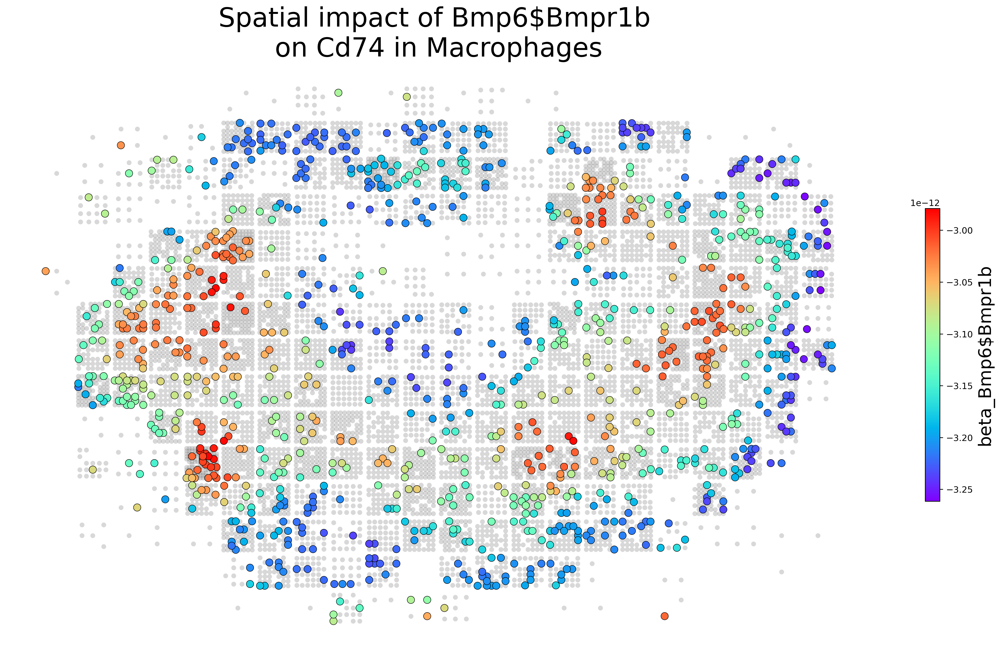

In [150]:
plt.rcParams['figure.figsize'] = (22, 12)
plt.rcParams['figure.dpi'] = 130

df_ = bdf[bdf['ct3'] == 'Mac_3_TGFB3+']
# df_ = bdf[bdf['ct3'] == 'Th17']
# df_ = bdf[bdf['ct3'] == 'B']
# df_ = bdf
df_ = df_[df_.x > 500]

target = 'beta_Bmp6$Bmpr1b'

fig, ax = plt.subplots()

ax.scatter(
    df['x'], df['y'],
    c='grey',
    alpha=0.3,
    s=30, marker='o',
    cmap='rainbow', linewidth=0.0, edgecolor='black'
)

scatter = ax.scatter(
    df_['x'], df_['y'],
    c=df_[target],
    s=70, marker='o',
    cmap='rainbow', linewidth=0.5, edgecolor='black'
)

ax.set_axis_off()
cbar = plt.colorbar(scatter, shrink=0.5)
cbar.set_label(target, fontsize=20)
plt.title(f'Spatial impact of {target.replace("beta_", "")} \non Cd74 in Macrophages', fontsize=30)
# plt.tight_layout()
plt.show()

In [158]:
from spaceoracle.prophets import Prophet
from spaceoracle.plotting.cartography import xy_from_adata
from spaceoracle.plotting.cartography import Cartography

In [179]:
adata.layers['Cd74'] = pd.read_parquet('/tmp/mouse_kidney_13/Cd74_2n_0x.parquet')
adata.layers['Pax5'] = pd.read_parquet('/tmp/mouse_kidney_13/Pax5_2n_0x.parquet')
adata.layers['Tgfb3'] = pd.read_parquet('/tmp/mouse_kidney_13/Tgfb3_2n_0x.parquet')

In [176]:
colors = ["#a6a5e8",
"#72be3e",
"#994dcc",
"#40c85d",
"#b332a3",
"#42952e",
"#d171e5",
"#a5bb36",
"#645ed0",
"#c5af3c",
"#5983e9",
"#e39c39",
"#3f64b2",
"#e56636",
"#4cbee0",
"#e2494f",
"#4ed1c3",
"#e73f77",
"#5bb767",
"#e85ec3",
"#3f7c33",
"#cf4696",
"#5fc695",
"#964aa1",
"#75902f",
"#a981e3",
"#4d661f",
"#dc85d1",
"#327243",
"#af356e",
"#93b66b",
"#72589f",
"#8f812b",
"#529bda",
"#b33b24",
"#31a49d",
"#bc3a53",
"#49996f",
"#e580a8",
"#1a6447",
"#ca92c9",
"#b56f20",
"#3d6ba0",
"#bdb26f",
"#7e7fc1",
"#665e1d",
"#a05d8f",
"#2f7b63",
"#e17e7d",
"#7e8149",
"#914665",
"#db9869",
"#a35053",
"#9a5e32"]

In [177]:
color_dict = dict(zip(adata.obs['ct2'].unique(), colors))
len(color_dict)

21

In [168]:
chart = Cartography(adata, color_dict)

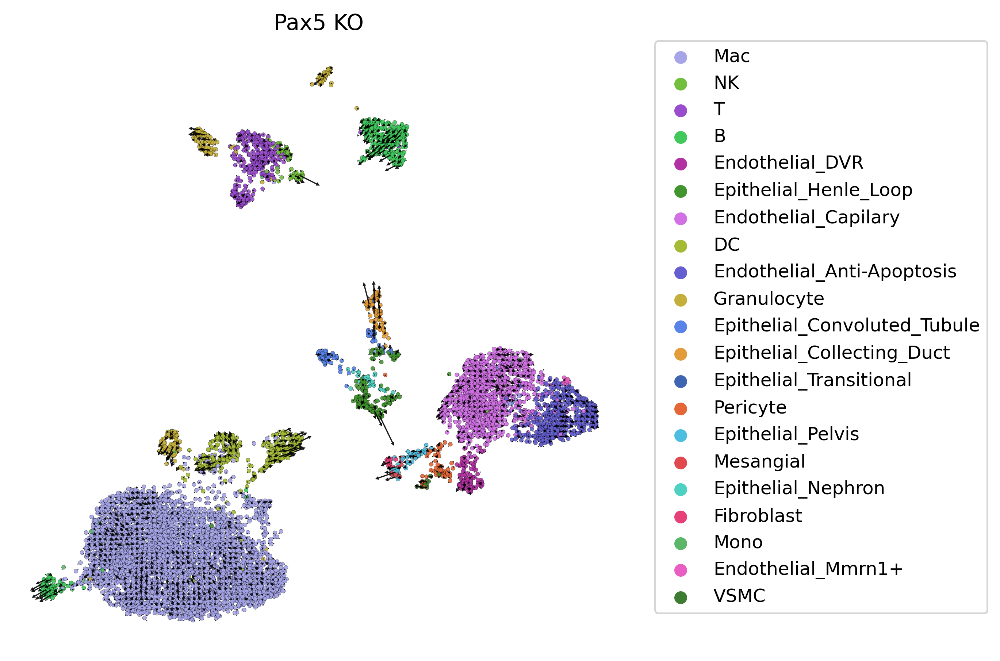

In [184]:
ax = chart.plot_umap_quiver(
    perturb_target='Pax5',
    grid_scale=2,
    vector_scale=1,
    figsize=(6, 6), 
    hue='ct2',
    legend_on_loc=False
)
plt.title('Pax5 KO')
plt.show()

In [27]:
estimator.betadata.to_parquet(f'./models/{estimator.target_gene}_betadata.parquet')

In [28]:
from spaceoracle.prophets import Prophet

In [29]:
pythia = Prophet(
    adata=estimator.adata,
    models_dir='./models',
    annot='cell_type_int',
    annot_labels='cell_type'
)

In [30]:
import decoupler as dc

markers = dc.get_resource(
    name='PanglaoDB',
    organism='mouse',
    license='academic'
)
markers = markers[markers['mouse'].astype(bool) & markers['canonical_marker'].astype(bool) & (markers['mouse_sensitivity'].astype(float) > 0.5)]
markers = markers[~markers.duplicated(['cell_type', 'genesymbol'])]
organ_markers = markers[markers['organ'] == 'Kidney']
organ_markers = set(organ_markers['genesymbol'].values)
len(organ_markers)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


61

In [12]:
# Annotations without hv_genes looks more biologically accurate

sc.tl.rank_genes_groups(adata_sc, groupby="ct3", use_raw=False)
hv_markers = pd.DataFrame(adata_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
hv_markers = list(np.unique(hv_markers.melt().value.values))
len(hv_markers)

1748

In [13]:
markers = list(set(hv_markers) | set(organ_markers))
len(markers)

1766

In [14]:
tg.pp_adatas(adata_sc, adata_st, genes=markers)

1718 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
2975 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.


In [15]:
%%time 

ad_map = tg.map_cells_to_space(adata_sc, adata_st,
    mode="clusters",
    cluster_label='ct3', 
    density_prior='rna_count_based',
    num_epochs=500,
    # device="cuda:0",
    # device='cpu',
    device='mps'
)

Allocate tensors for mapping.
Begin training with 1718 genes and rna_count_based density_prior in clusters mode...
Printing scores every 100 epochs.


Score: 0.097, KL reg: 0.129
Score: 0.180, KL reg: 0.001
Score: 0.184, KL reg: 0.001
Score: 0.185, KL reg: 0.001
Score: 0.186, KL reg: 0.001


Saving results..


CPU times: user 14.9 s, sys: 7.76 s, total: 22.6 s
Wall time: 7min 7s


In [16]:
tg.project_cell_annotations(ad_map, adata_st, annotation="ct3")
adata_st

spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


AnnData object with n_obs × n_vars = 172290 × 18491
    obs: 'id', 'n_genes', 'percent_mito', 'n_counts', 'uniform_density', 'rna_count_based_density'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'sparsity'
    uns: 'log1p', 'training_genes', 'overlap_genes'
    obsm: 'spatial', 'tangram_ct_pred'
    layers: 'raw_count', 'normalized_count'

In [17]:
adata_st.obs['ct3'] = adata_st.obsm['tangram_ct_pred'].idxmax(axis=1)
adata_st.obs['ct3'] = adata_st.obs['ct3'].astype('category')

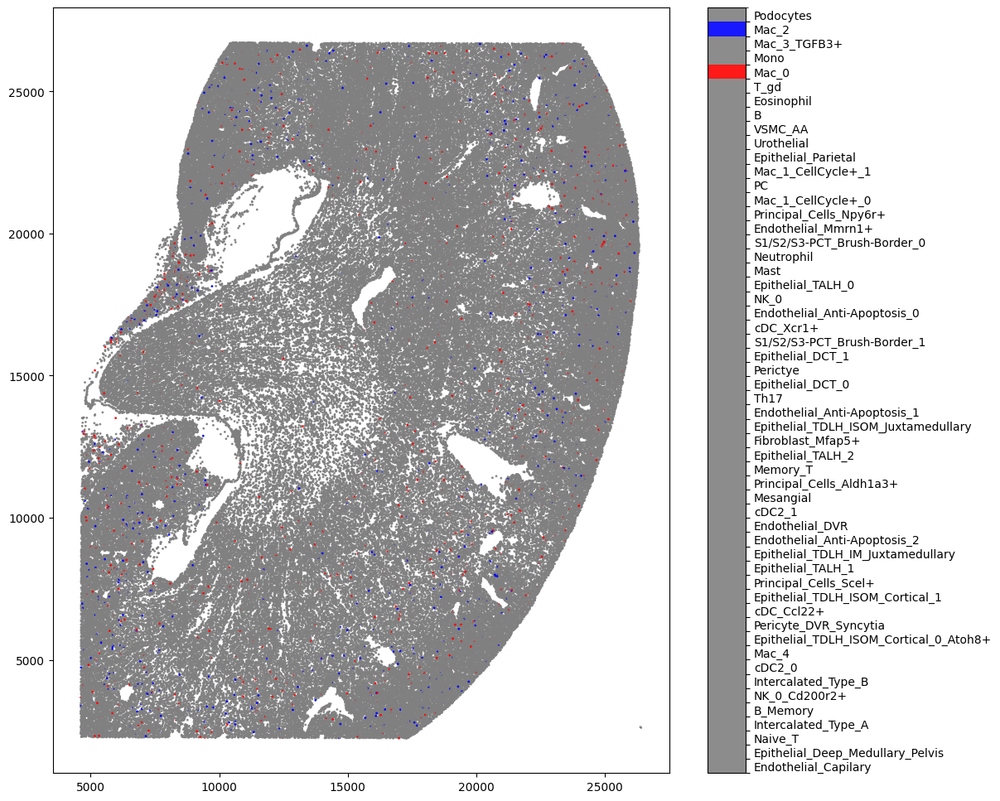

In [18]:
from matplotlib.colors import ListedColormap, BoundaryNorm

plt.figure(figsize=(12, 12))

unique_cell_types = adata_st.obs['ct3'].unique()
cell_type_to_numeric = {cell_type: idx for idx, cell_type in enumerate(unique_cell_types)}
adata_st.obs['predicted_numeric'] = adata_st.obs['ct3'].map(cell_type_to_numeric)

colors = ['gray'] * len(unique_cell_types)
if 'Mac_0' in cell_type_to_numeric:
    colors[cell_type_to_numeric['Mac_0']] = 'red'
if 'Mac_2' in cell_type_to_numeric:
    colors[cell_type_to_numeric['Mac_2']] = 'blue'
cmap = ListedColormap(colors)
norm = BoundaryNorm(range(len(unique_cell_types) + 1), cmap.N)

plt.scatter(adata_st.obsm['spatial'][:, 0], adata_st.obsm['spatial'][:, 1], 
            c=adata_st.obs['predicted_numeric'], s=1, alpha=0.9, cmap=cmap, norm=norm)

cbar = plt.colorbar(ticks=range(len(unique_cell_types)))
cbar.ax.set_yticklabels(unique_cell_types)

for label in cbar.ax.get_yticklabels():
    label.set_verticalalignment('bottom')  # Change alignment
    label.set_y(label.get_position()[1] + 0.05)  # Adjust y-position (move up)

plt.show()


In [19]:
celltypes = adata_sc.obs['ct3'].unique()

# ct3 is finer resolution than cell_types, which CO GRN and COMMOT LRs use

mapping = {}
for ct3 in celltypes:
    value = adata_sc[adata_sc.obs['ct3'] == ct3].obs['cell_type'].drop_duplicates().iloc[0]
    mapping[ct3] = value

In [20]:
adata_st.obs['cell_type'] = adata_st.obs['ct3'].map(mapping)
adata_st.obs['cell_type'].value_counts()

cell_type
Epithelial             79888
Myeloid                34510
Endothelial            18728
Mesenchymal_Stromal    17834
T                      11689
B                       6232
NK                      3409
Name: count, dtype: int64

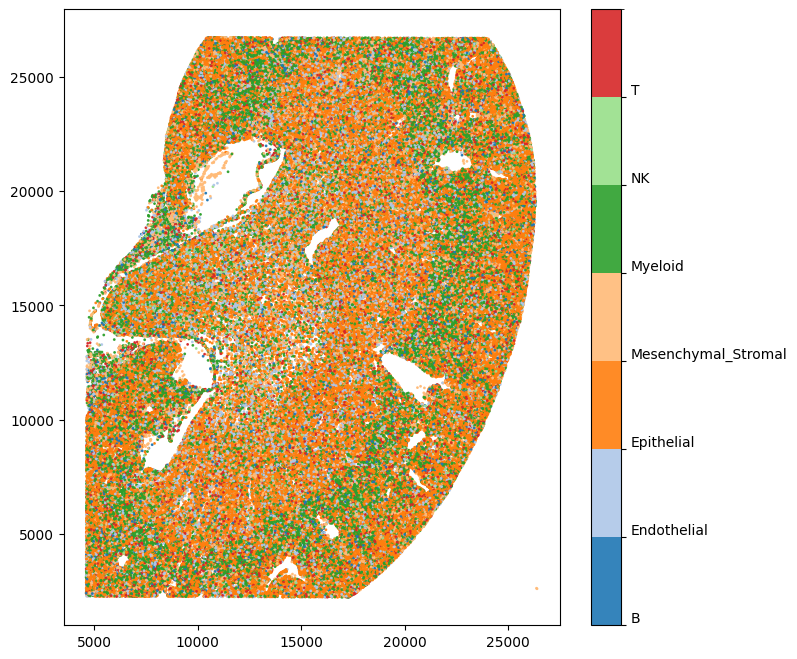

In [21]:
import seaborn as sns

# Get unique cell types from the cell_type column
unique_cell_types = sorted(adata_st.obs['cell_type'].unique())
cell_type_to_numeric = {cell_type: idx for idx, cell_type in enumerate(unique_cell_types)}
adata_st.obs['predicted_numeric'] = adata_st.obs['cell_type'].map(cell_type_to_numeric)

from matplotlib.colors import ListedColormap, BoundaryNorm

# Create a colormap and norm
cmap = ListedColormap(sns.color_palette("tab20", len(unique_cell_types)).as_hex())
norm = BoundaryNorm(range(len(unique_cell_types) + 1), cmap.N)

plt.figure(figsize=(8,8))
# Plot the scatter plot
plt.scatter(adata_st.obsm['spatial'][:, 0], adata_st.obsm['spatial'][:, 1], 
            c=adata_st.obs['predicted_numeric'], s=1, alpha=0.9, cmap=cmap, norm=norm)

# Create a color bar with cell type labels
cbar = plt.colorbar(ticks=range(len(unique_cell_types)))
cbar.ax.set_yticklabels(unique_cell_types)

for label in cbar.ax.get_yticklabels():
    label.set_verticalalignment('bottom')  # Change alignment
    label.set_y(label.get_position()[1] + 0.05)  # Adjust y-position (move up)

plt.show()


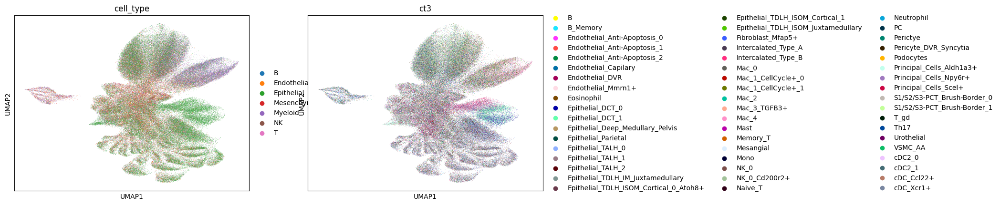

In [22]:
sc.tl.pca(adata_st, n_comps=20)
sc.pp.neighbors(adata_st, use_rep='X_pca')
# sc.pp.neighbors(adata_st, use_rep='X')
sc.tl.umap(adata_st)
sc.pl.umap(adata_st, color=['cell_type', 'ct3'])

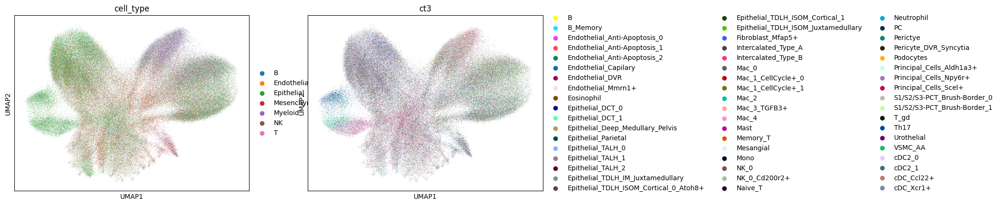

In [23]:
tmp = adata_st[:, list(set([x.lower() for x in hv_markers]) & set(adata_st.var_names))]
sc.tl.pca(tmp, n_comps=50)
sc.pp.neighbors(tmp, use_rep='X_pca')
sc.tl.umap(tmp)
sc.pl.umap(tmp, color=['cell_type', 'ct3'])

In [24]:
adata_sc.obs['cell_type'].value_counts()   

cell_type
Myeloid                5266
Endothelial            1779
Epithelial              462
B                       442
T                       361
Mesenchymal_Stromal     128
NK                       71
Name: count, dtype: int64

In [25]:
adata_st

AnnData object with n_obs × n_vars = 172290 × 18491
    obs: 'id', 'n_genes', 'percent_mito', 'n_counts', 'uniform_density', 'rna_count_based_density', 'ct3', 'predicted_numeric', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'sparsity'
    uns: 'log1p', 'training_genes', 'overlap_genes', 'pca', 'neighbors', 'umap', 'cell_type_colors', 'ct3_colors'
    obsm: 'spatial', 'tangram_ct_pred', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_count', 'normalized_count'
    obsp: 'distances', 'connectivities'

In [26]:
raw = adata_st.to_df(layer='raw_count').reindex(adata_sc.var_names, axis=1, fill_value=0)
normalized = adata_st.to_df(layer='normalized_count').reindex(adata_sc.var_names, axis=1, fill_value=0)

In [27]:
adata = sc.AnnData(
    X = raw,
    layers = {
        'raw_count': raw,
        'normalized_count': normalized,
    },
    obs = adata_st.obs,
    var = pd.DataFrame(index=adata_sc.var_names), 
    obsm = {
        'spatial': adata_st.obsm['spatial'],
        'X_pca': adata_st.obsm['X_pca'],
        'X_umap': adata_st.obsm['X_umap'],
    }
)

adata

AnnData object with n_obs × n_vars = 172290 × 3058
    obs: 'id', 'n_genes', 'percent_mito', 'n_counts', 'uniform_density', 'rna_count_based_density', 'ct3', 'predicted_numeric', 'cell_type'
    obsm: 'spatial', 'X_pca', 'X_umap'
    layers: 'raw_count', 'normalized_count'

In [28]:
import sys 
sys.path.append('../../src')
from spaceoracle.oracles import BaseTravLR
from spaceoracle.tools.utils import clean_up_adata


In [29]:
clean_up_adata(adata, fields_to_keep=['cell_type', 'ct3', 'X_umap'])
adata

AnnData object with n_obs × n_vars = 172290 × 3058
    obs: 'ct3', 'cell_type'
    obsm: 'spatial', 'X_pca', 'X_umap'
    layers: 'raw_count', 'normalized_count'

In [30]:
adata.var = pd.DataFrame(index=[x.capitalize() if x != 'ccdc198' else x for x in adata.var_names])
adata.var_names

Index(['Sox17', 'St18', 'Prex2', 'Lactb2', 'Kcnb2', 'Stau2', 'Pi15',
       'Crispld1', 'Tfap2b', 'Pkhd1',
       ...
       'Gpm6b', 'Ofd1', 'Egfl6', 'Tmsb4x', 'Tlr8', 'Tlr7', 'Frmpd4', 'Arhgap6',
       'Amelx', 'Mid1'],
      dtype='object', length=3058)

In [31]:
ref_adata = sc.read_h5ad('/Users/allywang/Desktop/work/S2025/SpaceOracle/data/mouse_kidney_13.h5ad')

for gt, gr in zip(sorted(adata.var_names), sorted(ref_adata.var_names)):
    if gt != gr:
        print(gt, gr)

D5ertd615e D5Ertd615e
D7ertd443e D7Ertd443e
H2-dmb2 H2-DMb2
H2-eb1 H2-Eb1
H2-ob H2-Ob
H2-q10 H2-Q10
H2-q6 H2-Q6
H2-q7 H2-Q7
Tcrg-c1 Tcrg-C1
Tcrg-c2 Tcrg-C2
Tcrg-c4 Tcrg-C4


In [32]:
adata = adata[:, sorted(adata.var_names)]
adata.var_names = sorted(ref_adata.var_names)

for gt, gr in zip(sorted(adata.var_names), sorted(ref_adata.var_names)):
    if gt != gr:
        print(gt, gr)

In [ ]:
# pcs = BaseTravLR.perform_PCA(adata)
# BaseTravLR.knn_imputation(adata, pcs, method='MAGIC')

# takes too long for 300k cells

In [ ]:
# sc.tl.pca(adata)
# sc.pp.neighbors(adata, use_rep='X_pca')
# sc.tl.umap(adata)
# sc.pl.umap(adata, color='cell_type')


In [33]:
adata.write_h5ad('/Users/allywang/Desktop/work/S2025/SpaceOracle/notebooks/mouse_kidney_visiumHD/mouse_kidney_visiumHD.h5ad')

### Batch correct

In [79]:
ref_adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_13.h5ad')
ref_adata

AnnData object with n_obs × n_vars = 8509 × 3058
    obs: 'ct1', 'ct2', 'ct3', 'ct4', 'cond', 'medulla_cortex', 'domain', 'cell_type', 'cell_type_int'
    uns: 'cell_thresholds', 'cell_type_colors', 'neighbors', 'pca', 'received_ligands', 'received_ligands_tfl', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
    varm: 'PCs'
    layers: 'imputed_count', 'normalized_count', 'raw_count'
    obsp: 'connectivities', 'distances'

In [80]:
test_adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD.h5ad')
test_adata

AnnData object with n_obs × n_vars = 172290 × 3058
    obs: 'ct3', 'cell_type'
    obsm: 'X_pca', 'X_umap', 'spatial'
    layers: 'normalized_count', 'raw_count'

In [81]:
# rescale 
import sys
sys.path.append('../../src')
from spaceoracle.tools.utils import scale_adata

test_adata = scale_adata(test_adata, cell_size=8) # using stardist segmentation makes the cells small
test_adata

AnnData object with n_obs × n_vars = 172290 × 3058
    obs: 'ct3', 'cell_type'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
    layers: 'normalized_count', 'raw_count'

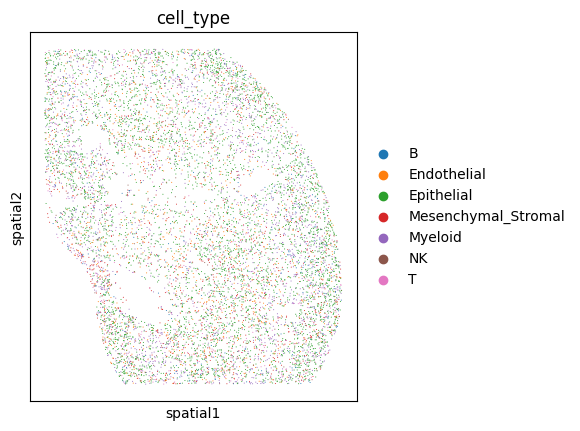

AnnData object with n_obs × n_vars = 10000 × 3058
    obs: 'ct3', 'cell_type'
    uns: 'cell_type_colors'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
    layers: 'normalized_count', 'raw_count'

In [82]:
# subsample 

np.random.seed(42)
test_adata = test_adata[np.random.choice(test_adata.obs_names, size=10000, replace=False)].copy()

sc.pl.spatial(test_adata, color='cell_type', spot_size=20)
test_adata

In [83]:
test_adata.X.max(), ref_adata.X.max()

(165.0, 10652.0)

In [84]:
test_adata.X = test_adata.layers['raw_count'].copy()
ref_adata.X = ref_adata.layers['raw_count'].toarray().copy()

In [85]:
import scvi

batch_key = 'batch'

# Step 1: Prepare and train on reference
adata_ref = ref_adata.copy()
adata_ref.obs[batch_key] = 'ref_batch'
adata_ref.obs[batch_key] = adata_ref.obs[batch_key].astype('category')

scvi.model.SCVI.setup_anndata(adata_ref, batch_key="batch", layer="raw_count")

scvi_ref = scvi.model.SCVI(
    adata_ref,
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
)
scvi_ref.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|██████████| 400/400 [17:02<00:00,  2.52s/it, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.21e+3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [17:02<00:00,  2.56s/it, v_num=1, train_loss_step=1.19e+3, train_loss_epoch=1.21e+3]


In [86]:
adata_query = test_adata.copy()
adata_query.obs[batch_key] = 'query_batch'
adata_query.obs[batch_key] = adata_query.obs[batch_key].astype('category')

scvi.model.SCVI.prepare_query_anndata(adata_query, scvi_ref)

INFO     Found 100.0% reference vars in query data.                                                                


In [87]:
scvi_query = scvi.model.SCVI.load_query_data(
    adata_query,
    scvi_ref,
)

In [88]:
scvi_query.train(max_epochs=200, plan_kwargs={"weight_decay": 0.0})

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 200/200: 100%|██████████| 200/200 [05:57<00:00,  1.78s/it, v_num=1, train_loss_step=242, train_loss_epoch=223]

`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 200/200: 100%|██████████| 200/200 [05:57<00:00,  1.79s/it, v_num=1, train_loss_step=242, train_loss_epoch=223]


In [89]:
corrected_expr_ref = scvi_ref.get_normalized_expression(
    adata_ref,
    return_mean=True,
    library_size=1e4)

In [90]:
corrected_expr_query = scvi_query.get_normalized_expression(
    adata_query, 
    return_mean=True,
    library_size=1e4)

In [91]:
abs(corrected_expr_ref- ref_adata.to_df(layer='normalized_count')).values.sum()

81816520.0

In [92]:
abs(corrected_expr_query- test_adata.to_df(layer='normalized_count')).values.sum()

98605599.245323

In [93]:
corrected_expr_ref.values.min(), corrected_expr_ref.values.max()

(5.077274e-05, 5661.2725)

In [94]:
corrected_expr_query.values.min(), corrected_expr_query.values.max()

(0.0008134386, 927.75946)

In [95]:
test_adata.layers['corrected_count'] = corrected_expr_query.values

In [96]:
test_adata.X = test_adata.layers['corrected_count']
sc.pp.log1p(test_adata)
test_adata.layers['imputed_count'] = test_adata.X

In [97]:
ref_adata.to_df(layer='imputed_count')['Mif'].min(), ref_adata.to_df(layer='imputed_count')['Mif'].max()

(0.01178149222756511, 1.6106592491071925)

In [98]:
test_adata.to_df(layer='imputed_count')['Mif'].min(), test_adata.to_df(layer='imputed_count')['Mif'].max()

(0.31824103, 1.4394753)

In [99]:
test_adata

AnnData object with n_obs × n_vars = 10000 × 3058
    obs: 'ct3', 'cell_type'
    uns: 'cell_type_colors', 'log1p'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
    layers: 'normalized_count', 'raw_count', 'corrected_count', 'imputed_count'

In [100]:
# from spaceoracle.oracles import BaseTravLR

# pcs = BaseTravLR.perform_PCA(test_adata)
# BaseTravLR.impute_clusterwise(test_adata,layer='corrected_count')

In [101]:
test_adata.write_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD_subsampled.h5ad')

### Get Banksy embeddings

In [102]:
sys.path.append('/ix/djishnu/alw399/SpaceOracle/src/Banksy_py')

In [103]:
# adata_train = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD_subsampled.h5ad')
# adata_train 

adata_train = test_adata

In [104]:
adata_train.X = adata_train.layers['imputed_count']

In [105]:
# make space 

import gc
del adata_train.layers['raw_count']
del adata_train.layers['normalized_count']

In [106]:
from banksy.main import median_dist_to_nearest_neighbour

plot_graph_weights = True
k_geom = 15 # number of spatial neighbours
max_m = 1 # use both mean and AFT
nbr_weight_decay = "scaled_gaussian" # can also choose "reciprocal", "uniform" or "ranked"

# Find median distance to closest neighbours
nbrs = median_dist_to_nearest_neighbour(adata_train, key = 'spatial')



Median distance to closest cell = 25.380624662852597

---- Ran median_dist_to_nearest_neighbour in 0.01 s ----




Median distance to closest cell = 25.380624662852597

---- Ran median_dist_to_nearest_neighbour in 0.01 s ----

---- Ran generate_spatial_distance_graph in 0.03 s ----

---- Ran row_normalize in 0.02 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.16 s ----

----- Plotting Edge Histograms for m = 0 -----

Edge weights (distances between cells): median = 83.18697894967066, mode = 87.19779473526201

---- Ran plot_edge_histogram in 0.03 s ----


Edge weights (weights between cells): median = 0.05770565534957329, mode = 0.03443873583270262

---- Ran plot_edge_histogram in 0.03 s ----

---- Ran generate_spatial_distance_graph in 0.05 s ----

---- Ran theta_from_spatial_graph in 0.04 s ----

---- Ran row_normalize in 0.02 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.23 s ----

----- Plotting Edge Histograms for m = 1 -----

Edge weights (distances between cells): median = 118.38716132659405, mode = 120.95736044381083

---- Ran plot_edge_histogram in 0.03 s ----


Edge

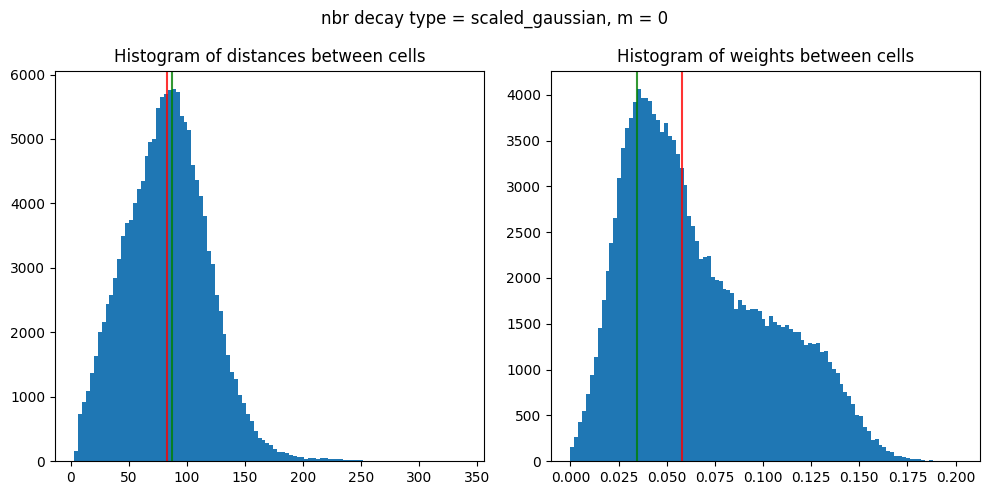

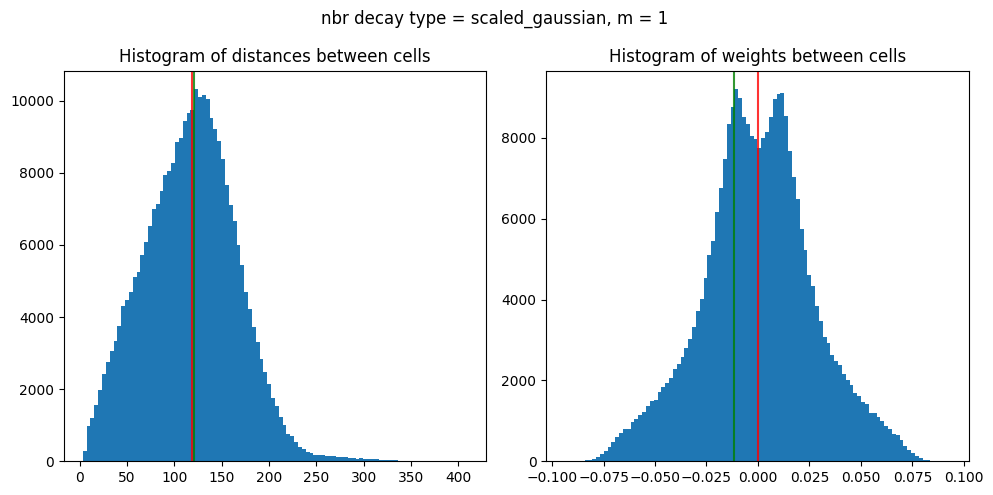

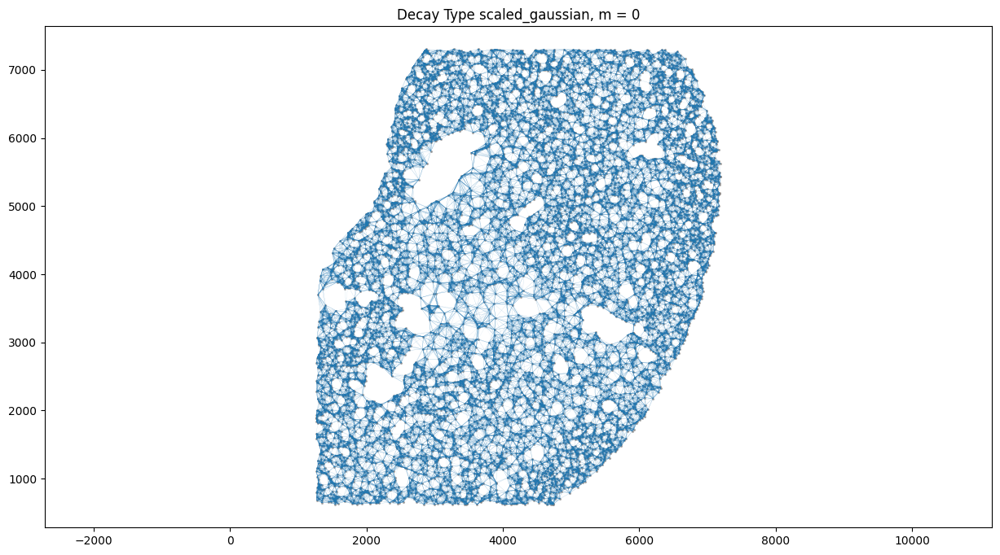

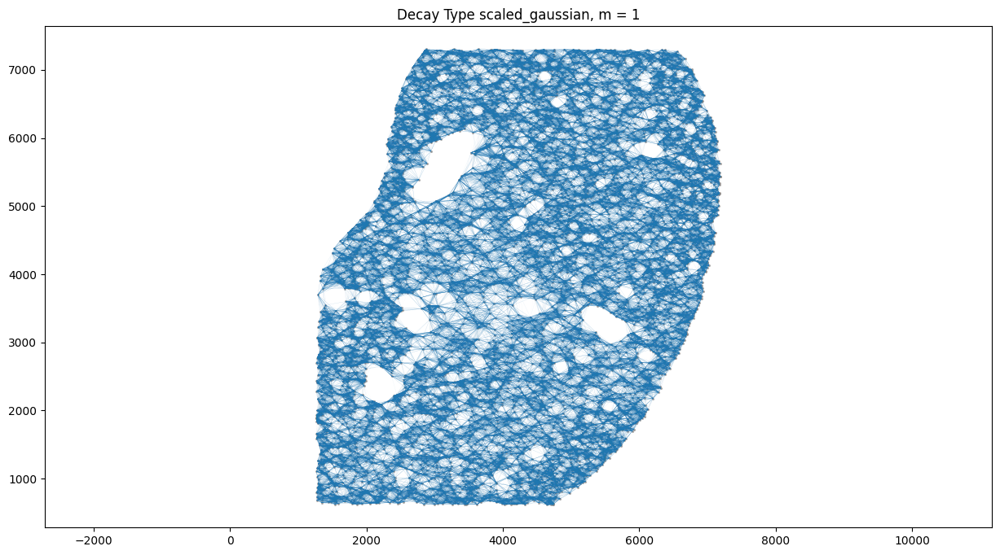

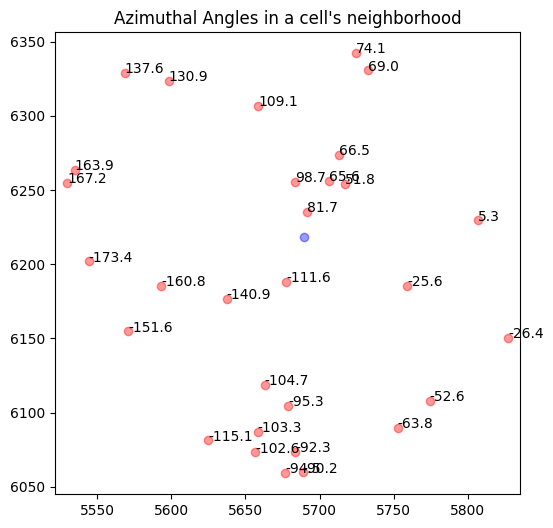

In [107]:
from banksy.initialize_banksy import initialize_banksy

banksy_dict = initialize_banksy(
    adata_train,
    ('x', 'y', 'spatial'),
    k_geom,
    nbr_weight_decay=nbr_weight_decay,
    max_m=max_m,
    plt_edge_hist=True,
    plt_nbr_weights=True,
    plt_agf_angles=False, # takes long time to plot
    plt_theta=True,
)

In [108]:
from banksy.embed_banksy import generate_banksy_matrix

# The following are the main hyperparameters for BANKSY
# -----------------------------------------------------
resolutions = [1.0]  # clustering resolution for UMAP
pca_dims = [50]  # Dimensionality in which PCA reduces to
lambda_list = [0.2]  # list of lambda parameters

banksy_dict, banksy_matrix = generate_banksy_matrix(adata_train,
                                                    banksy_dict,
                                                    lambda_list,
                                                    max_m)
banksy_matrix

Runtime May-18-2025-20-38

3058 genes to be analysed:
Gene List:
Index(['A1bg', 'A4galt', 'Aadac', 'Aadat', 'Aak1', 'Abat', 'Abca1', 'Abca13',
       'Abca7', 'Abca8a',
       ...
       'Zfyve28', 'Zfyve9', 'Zmynd15', 'Znrf1', 'Znrf3', 'Zranb3', 'Zswim7',
       'Zswim9', 'Zwilch', 'ccdc198'],
      dtype='object', length=3058)

Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <10000x10000 sparse matrix of type '<class 'numpy.float64'>'
	with 150000 stored elements in Compressed Sparse Row format>, 1: <10000x10000 sparse matrix of type '<class 'numpy.complex128'>'
	with 300000 stored elements in Compressed Sparse Row format>}}

Nbr matrix | Mean: 0.98 | Std: 0.74
Size of Nbr | Shape: (10000, 3058)
Top 3 entries of Nbr Mat:

[[0.70320783 0.55096501 0.96368784]
 [0.69961286 0.72527054 1.00148793]
 [0.78070717 0.46877011 0.96437938]]



AGF matrix | Mean: 0.05 | Std: 0.05
Size of AGF mat (m = 1) | Shape: (10000, 3058)
Top entries of AGF:
[[0.01367076 0.02145865 0.03097746]
 [0.03814911 0.02809263 0.04924949]
 [0.03349054 0.0078066  0.02011265]]
Ran 'Create BANKSY Matrix' in 0.05 mins

Cell by gene matrix has shape (10000, 3058)

Scale factors squared: [0.8        0.13333333 0.06666667]
Scale factors: [0.89442719 0.36514837 0.25819889]
Shape of BANKSY matrix: (10000, 9174)
Type of banksy_matrix: <class 'anndata._core.anndata.AnnData'>



AnnData object with n_obs × n_vars = 10000 × 9174
    obs: 'ct3', 'cell_type'
    var: 'is_nbr', 'k'

In [109]:
adata_train, banksy_matrix

(AnnData object with n_obs × n_vars = 10000 × 3058
     obs: 'ct3', 'cell_type'
     uns: 'cell_type_colors', 'log1p'
     obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
     layers: 'corrected_count', 'imputed_count',
 AnnData object with n_obs × n_vars = 10000 × 9174
     obs: 'ct3', 'cell_type'
     var: 'is_nbr', 'k')

In [110]:
banksy_matrix.var_names

Index(['A1bg', 'A4galt', 'Aadac', 'Aadat', 'Aak1', 'Abat', 'Abca1', 'Abca13',
       'Abca7', 'Abca8a',
       ...
       'Zfyve28_nbr_1', 'Zfyve9_nbr_1', 'Zmynd15_nbr_1', 'Znrf1_nbr_1',
       'Znrf3_nbr_1', 'Zranb3_nbr_1', 'Zswim7_nbr_1', 'Zswim9_nbr_1',
       'Zwilch_nbr_1', 'ccdc198_nbr_1'],
      dtype='object', length=9174)

In [111]:
import numpy as np

df = banksy_matrix.to_df().values
np.min(df), np.max(df)

(-4.916860103607178, 24.232786178588867)

In [112]:
# Save the BANKSY matrix embeddings
# ---------------------------------

banksy_dir = '/ix/djishnu/shared/djishnu_kor11/banksy_outputs'
banksy_matrix.to_df().to_parquet(f'{banksy_dir}/mouse_kidney_visiumHD_subsampled_embedding.parquet')